# Table of contents

* [Environment set up](#scrollTo=0_Environment_set_up)
* [SAT Trails](#scrollTo=1_SAT_Trails)
    * [Trails and alpine huts](#scrollTo=1_1_Trails_and_alpine_huts)
    * [Trails binding alpine huts](#scrollTo=1_2_Trails_binding_alpine_huts)
* [Trentino Alto Adige Trails Network](#scrollTo=2_Trentino_Alto_Adige_Trails_Network)
    * [Trails network](#scrollTo=2_1_Trails_network)
    * [Peaks Huts on the Graph](#scrollTo=2_2_Peaks_Huts_on_the_Graph)
    * [Add elevation attributes](#scrollTo=2_3_Add_elevation_attributes)
    * [Add edge speeds attributes](#scrollTo=2_4_Add_edge_speeds_attributes)
    * [from huts to peaks considering elevation](#scrollTo=2_5_from_huts_to_peaks_considering_elevation)

* [Trentino Alto Adige Street Trails Network analyses](#scrollTo=3_Trentino_Alto_Adige_Street_Trail_Network_analyses)
    * [Connect_streets_to_trails](#scrollTo=3_1_Connect_streets_to_trails)
    * [Tn/Bz_to_huts](#scrollTo=3_2_Tn_Bz_to_huts)
    * [Navigate!](#scrollTo=3_3_Navigate_)

<br/>
@Gabriele Ghisleni, Data Science.
<br/><hr/>


# &nbsp; 0. Environment set up

In [1]:
%%capture
!pip install geopandas==0.10.2
!pip install mapclassify==2.4.3
!pip install selenium==4.2.0
!pip install pygeos==0.10.2
!pip install git+https://github.com/python-visualization/branca
!pip install -U folium
!apt-get install libspatialindex-dev
!pip install rtree==0.9.7
!pip install -U osmnx==1.1.1
!pip install --upgrade numpy
!pip install matplotlib==3.1.3

In [42]:
from folium import GeoJson, GeoJsonTooltip, Map, Marker, Icon, PolyLine, FeatureGroup
import sys, os, re, mapclassify, datetime, folium, pprint, rtree, requests 
from shapely.geometry import LineString, Point
import matplotlib.pyplot as plt
from google.colab import drive
from tqdm.auto import tqdm
import geopandas as gpd
import pandas as pd
import osmnx  as ox
import numpy as np

pprint = pprint.PrettyPrinter(indent=4).pprint
drive.mount('/content/drive')

# change this to your folder directory
folder_directory = "/content/drive/MyDrive/_____SHARED/Geospatial"
sys.path.append(folder_directory)
os.chdir(folder_directory)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
%%capture
#download the necessary utils files
if 'geo_utils' not in os.listdir():
  os.mkdir('geo_utils')

if "utils.py" not in os.listdir('geo_utils'):
  url_utils = "https://raw.githubusercontent.com/GabrieleGhisleni/Geo-Dolomities/master/utils/utils.py"
  url_style = "https://raw.githubusercontent.com/GabrieleGhisleni/Geo-Dolomities/master/utils/styles.py"
  !wget --no-cache --backups=1 -P'geo_utils' {url_utils} 
  !wget --no-cache --backups=1 -P'geo_utils' {url_style} 
  !touch utils/__init__.py
  assert 'utils.py' in os.listdir('geo_utils'), 'utils.py not present'
  assert 'styles.py' in os.listdir('geo_utils'), 'styles.py not present'

#in case ModuleError restart the kernel
import geo_utils.utils as utils 
import geo_utils.styles as styles
tiles = 'Stamen Terrain'

# &nbsp; 1. SAT Trails

Load the data from https://www.sat.tn.it/sentieri/mappa-sentieri/; this data are available under the license 'Open Data Commons Open Database License (ODbL)' and distributed by "© Società degli Alpinisti Tridentini (SAT)".

Alternatively they were provided (but not updated trough the CatalogueServiceWeb("http://geodati.gov.it/RNDT/csw") under the denomination of 'p_TN_f3547bc8-bf1e-4731-85d2-2084d1f4ba07'.

In this data we have the mountain trail maintaned and handled by SAT.

In [4]:
# load the data and selecting fields
sentieri_SAT = gpd.read_file('data/SAT/sentieri_tratte.shp')
selected_cols = ['numero', 'competenza', 'denominaz', 'difficolta', 'loc_fine', 'quota_iniz', 'quota_fine', 't_andata', 't_ritorno', 'geometry']
sentieri_SAT = sentieri_SAT.loc[:, selected_cols]
sentieri_SAT.to_crs(epsg=4326, inplace=True)

In [5]:
# load dolomities data
dolomiti_df = gpd.read_file('data/geo_dolomiti/dolomiti_geo.shp')
dolomiti_df.loc[2, ["name"]] = "Sistema 3 - Pale di San Martino"

# load italian regions & provinces
dolomiti_regions, dolomiti_provincies, dolomiti_municipalities = utils.load_italian_north_east_area()

# buffering on fly on epsg 32632
dolomiti_df.geometry = dolomiti_df.to_crs(epsg=32632).geometry.buffer(300).to_crs(epsg=4326).values
sentieri_SAT_in_dolomities = sentieri_SAT.geometry.apply(lambda x: utils.element_crosses_or_within_area(x, dolomiti_df, 'name'))
assert dolomiti_df.crs == sentieri_SAT.crs

# selecting only the path that are closeby the dolomities
sentieri_SAT['dolomities'] = sentieri_SAT_in_dolomities
sentieri_SAT_in_dolomities = sentieri_SAT.loc[~sentieri_SAT.dolomities.isna()].reset_index(drop=True)
sentieri_SAT_in_dolomities['DEN_REG'] = sentieri_SAT_in_dolomities.geometry.apply(lambda x: utils.element_within_area(x, dolomiti_regions, 'DEN_REG'))
sentieri_SAT_in_dolomities = sentieri_SAT_in_dolomities.dropna(subset=['DEN_REG'])
sentieri_SAT_in_dolomities = sentieri_SAT_in_dolomities.loc[sentieri_SAT_in_dolomities.geometry.is_valid]
unique_dolomities_group = sentieri_SAT_in_dolomities.dolomities.unique().tolist()

sentieri_SAT_in_dolomities.head(2)

,numero,competenza,denominaz,difficolta,loc_fine,quota_iniz,quota_fine,t_andata,t_ritorno,geometry,dolomities,DEN_REG
0,E511,SEZ. SAT PREDAZZO,VIA FERRATA DEI CAMPANILI DEL LATEMAR,EEA-D,"FORCELLA GRANDE - Bivacco ""Mario Rigatti""",2570,2634,01:30,01:30,"LINESTRING (11.56540 46.38048, 11.56547 46.380...",Sistema 7 - Sciliar-Catinaccio & Latemar,Trentino-Alto Adige
1,E714,SAT O.C.,"VIA FERRATA ""NICO GUSELLA""",EEA-D,FORCELLA DEL PORTON,2451,2420,02:00,02:00,"LINESTRING (11.84688 46.24668, 11.84683 46.246...",Sistema 3 - Pale di San Martino,Trentino-Alto Adige


In [6]:
# Explore in which provinces are the SAT paths
path_per_dolomities = {k : len(sentieri_SAT_in_dolomities.loc[sentieri_SAT_in_dolomities.DEN_REG == k]) for k in sentieri_SAT_in_dolomities.DEN_REG.unique()}
for name, value in sorted(path_per_dolomities.items(), key=lambda item: item[1]):
  print(f'Number of path in {name}: {value}')

print('-'*50)
# Explore in which group of dolomities are the SAT paths
path_per_dolomities = {k : len(sentieri_SAT_in_dolomities.loc[sentieri_SAT_in_dolomities.dolomities == k]) for k in unique_dolomities_group}
for name, value in sorted(path_per_dolomities.items(), key=lambda item: item[1]):
  print(f'Number of path in {name}: {value}')

Number of path in Trentino-Alto Adige: 119
--------------------------------------------------
Number of path in Sistema 2 - Marmolada: 7
Number of path in Sistema 3 - Pale di San Martino: 21
Number of path in Sistema 7 - Sciliar-Catinaccio & Latemar: 29
Number of path in Sistema 9 - Dolomiti di Brenta: 62


In [7]:
# filter all the dolomities only for the intersted provinces:
dolomiti_df = dolomiti_df.loc[dolomiti_df['name'].isin(sentieri_SAT_in_dolomities.dolomities.unique())]
dolomiti_geo = GeoJson(data = dolomiti_df, style_function = styles.style_dolomiti, tooltip = GeoJsonTooltip(fields=['name', 'url_info', 'area']))

In [8]:
sat_dolomities_map = utils.get_new_map(title='SAT Trail on the Dolomities', tiles=tiles)

# create relevant feature layers
feature_layers = {group:FeatureGroup(name=f"Group of dolomities: {group}") for group in unique_dolomities_group}
feature_layers['dolomiti_area'] =  FeatureGroup(name='Area Dolomiti')
dolomiti_geo.add_to(feature_layers['dolomiti_area'])

# SAT Paths
for _, row in sentieri_SAT_in_dolomities.iterrows():
  line = PolyLine(
    locations = [list(reversed(i)) for i in list(row.geometry.coords)],
    tooltip = utils.get_info_from_row(row),
    popup = utils.get_info_from_row(row),
    color='darkred', weight=3,
  )

  line.add_to(feature_layers[row.dolomities])

utils.add_map_infos(feature_layers, sat_dolomities_map)

## &nbsp; 1.1 Trails and alpine huts

In [9]:
# load previusoly processed data about huts
osm_rifugi = gpd.read_file('data/alpine_huts/osm_dolomities.shp')

# filter the huts so that we have the same dolomities group
osm_rifugi = osm_rifugi.loc[osm_rifugi.dolomities.isin(unique_dolomities_group)]

In [10]:
# huts and paths together
sat_hut_dolomities_map = utils.get_new_map(title='Path & Huts according to Dolomities group', tiles=tiles)

feature_layers = {group:FeatureGroup(name=f"Group of dolomities: {group}") for group in unique_dolomities_group}
feature_layers['dolomiti_area'] =  FeatureGroup(name='Area Dolomiti')
dolomiti_geo.add_to(feature_layers['dolomiti_area'])

# SAT Paths
for _, row in sentieri_SAT_in_dolomities.iterrows():
  line = PolyLine(
    locations = [list(reversed(i)) for i in list(row.geometry.coords)],
    tooltip = utils.get_info_from_row(row),
    popup = utils.get_info_from_row(row),
    color='darkred', weight=3,
  )

  line.add_to(feature_layers[row.dolomities])

# Huts
for idx, row in osm_rifugi.iterrows():
  marker = Marker(
      location = [i[0] for i in reversed(row.geometry.xy)],
      tooltip = utils.get_info_from_row(row),
      popup = utils.get_info_from_row(row),
      icon = Icon(color = styles.c_colors[unique_dolomities_group.index(row.dolomities)])
  )
  marker.add_to(feature_layers[row.dolomities])

utils.add_map_infos(feature_layers, sat_hut_dolomities_map, collapsed_legend=True)

## &nbsp; 1.2 Trails binding alpine huts

In [11]:
osm_rifugi_buffered = osm_rifugi.copy()
osm_rifugi_buffered.geometry = osm_rifugi.to_crs(epsg=32632).buffer(50).to_crs(epsg=4326)

In [12]:
res = []

# saving only the huts that are reached from a SAT path
for i in range(len(osm_rifugi_buffered)):
  intersection_idx = sentieri_SAT_in_dolomities.geometry.crosses(osm_rifugi_buffered.geometry.values[i])
  idx_trues = np.nonzero(intersection_idx.values)[0]

  if idx_trues.size > 0:
    res.append(idx_trues.tolist())
  else:
    res.append(None)

osm_rifugi_buffered['path'] = res
osm_rifugi_buffered = osm_rifugi_buffered.loc[~osm_rifugi_buffered.path.isna()].reset_index(drop=True)
hut_reachable = osm_rifugi_buffered['name'].unique()

In [13]:
sentieri_SAT_in_dolomities['reachable_huts'] = ""

# add information to the path of the hut that is possible to reach
for idx, row in osm_rifugi_buffered.iterrows():
  name = row['name']
  for path in row.path:
    current = sentieri_SAT_in_dolomities.iloc[path]['reachable_huts']
    sentieri_SAT_in_dolomities.loc[path, ['reachable_huts']] = f"{current}, {name}" if current else f"{name}"


# add to huts the trail by which are accessible
trail_to_huts = []
for paths in osm_rifugi_buffered.path:
  tmp = []
  for path in paths:
    tmp.append(sentieri_SAT_in_dolomities.iloc[path].numero)
  trail_to_huts.append(', '.join(tmp))

osm_rifugi_buffered["accessible_via_path"] = trail_to_huts
osm_rifugi_buffered['centroid'] = osm_rifugi_buffered.to_crs(epsg=32632).geometry.centroid
sentieri_SAT_in_dolomities = sentieri_SAT_in_dolomities.loc[sentieri_SAT_in_dolomities.geometry.is_valid]

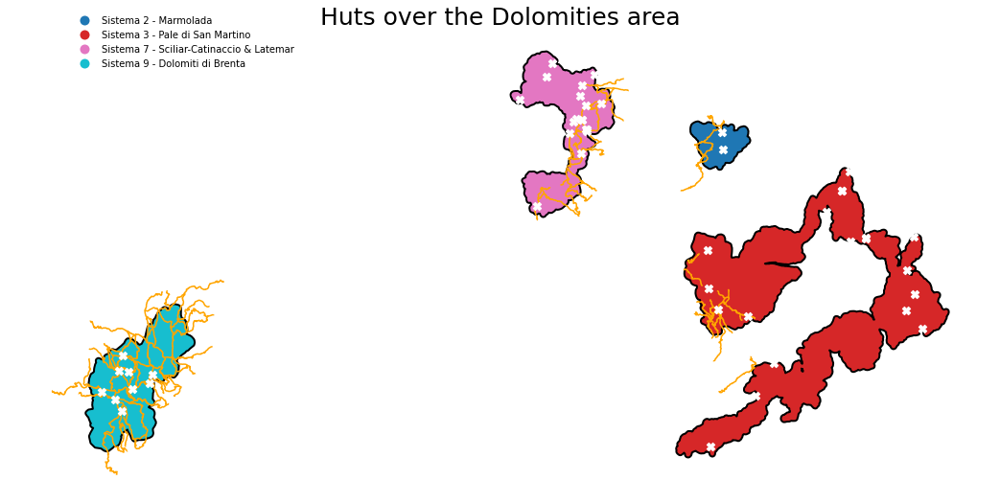

In [14]:
# explore with static maps
fig, axes = plt.subplots(1,1, figsize=(15,15))

dolomiti_df.to_crs(epsg=4326).plot(
    ax=axes,
    linewidth=2,
    edgecolor='black',
    column='name',
    cmap = "tab10",
    legend=True,  
    categorical=True,
    zorder=0,
    legend_kwds= {
        'bbox_to_anchor':(.3, 1.05),
        'fontsize':10,
        'frameon':False
        }
)

sentieri_SAT_in_dolomities.to_crs(epsg=4326).plot(ax=axes, color = "orange", zorder=1)
osm_rifugi.to_crs(epsg=4326).plot(ax=axes, color='white', markersize=70, marker="X", zorder=2)

plt.title('Huts over the Dolomities area', fontdict=dict(size=25))
plt.tight_layout()
plt.axis('off')
plt.show()

In [15]:
# huts and paths together
sat_hut_path_dolomities_map = utils.get_new_map(title='Path & Huts according to Dolomities group', tiles=tiles)

feature_layers = {group:FeatureGroup(name=f"Hut: {group}") for group in hut_reachable}
feature_layers['dolomiti_area'] =  FeatureGroup(name='Area Dolomiti')
dolomiti_geo.add_to(feature_layers['dolomiti_area'])

# Huts - SAT paths
for idx, row in osm_rifugi_buffered.iterrows():
  marker_group = row['name']
  marker = Marker(
      location = [i[0] for i in reversed(row.geometry.centroid.xy)],
      tooltip = utils.get_info_from_row(row),
      popup = utils.get_info_from_row(row),
      icon = Icon(color = styles.c_colors[unique_dolomities_group.index(row.dolomities)])
  )
  marker.add_to(feature_layers[marker_group])

  for path in row.path:
    row = sentieri_SAT_in_dolomities.iloc[path]
    line = PolyLine(
      locations = [list(reversed(i)) for i in list(row.geometry.coords)],
      tooltip = utils.get_info_from_row(row),
      popup = utils.get_info_from_row(row),
      color='darkred', weight=3,
    )

    line.add_to(feature_layers[marker_group])


utils.add_map_infos(feature_layers, sat_hut_path_dolomities_map, collapsed_legend=True)

# &nbsp; 2 Trentino Alto Adige Trails Network

## &nbsp; 2.1 Trails network

Generate the trails network of the main dolomities in Trentino-Alto Adige

In [43]:
import networkx

if 'trail_network.graphml' not in os.listdir('data'):
  buffer = 1_500
  all_graphs = []
  dolomiti_df_buf = dolomiti_df.copy()
  dolomiti_df_buf.geometry = dolomiti_df_buf.to_crs(epsg=32632).buffer(buffer).to_crs(epsg=4236)
  for idx, row in dolomiti_df_buf.iterrows():
    graph = ox.graph_from_polygon(
        row.geometry,
        network_type = 'walk', 
    )

    all_graphs.append(graph)

  G_trail = networkx.compose_all(all_graphs)
  ox.save_graphml(G_trail, 'data/trail_network.graphml')

else:
  G_trail = ox.load_graphml('data/trail_network.graphml')

print(f'total_edges: {len(ox.graph_to_gdfs(G_trail, edges=True, nodes=False))}')
print(f'total_nodes: {len(ox.graph_to_gdfs(G_trail, edges=False, nodes=True))}\n')

#stats
G_trail_stats = ox.basic_stats(G_trail)
pprint(G_trail_stats)

total_edges: 13808
total_nodes: 5340

{   'circuity_avg': 1.2920567942069912,
    'edge_length_avg': 363.78672436268954,
    'edge_length_total': 5023167.090000018,
    'intersection_count': 4265,
    'k_avg': 5.171535580524345,
    'm': 13808,
    'n': 5340,
    'self_loop_proportion': 0.00043453070683661645,
    'street_length_avg': 363.78672436268835,
    'street_length_total': 2511583.5450000004,
    'street_segment_count': 6904,
    'streets_per_node_avg': 2.682771535580524,
    'streets_per_node_counts': {   0: 0,
                                   1: 1075,
                                   2: 0,
                                   3: 3827,
                                   4: 423,
                                   5: 13,
                                   6: 1,
                                   7: 1},
    'streets_per_node_proportions': {   0: 0.0,
                                        1: 0.20131086142322097,
                                        2: 0.0,
                 

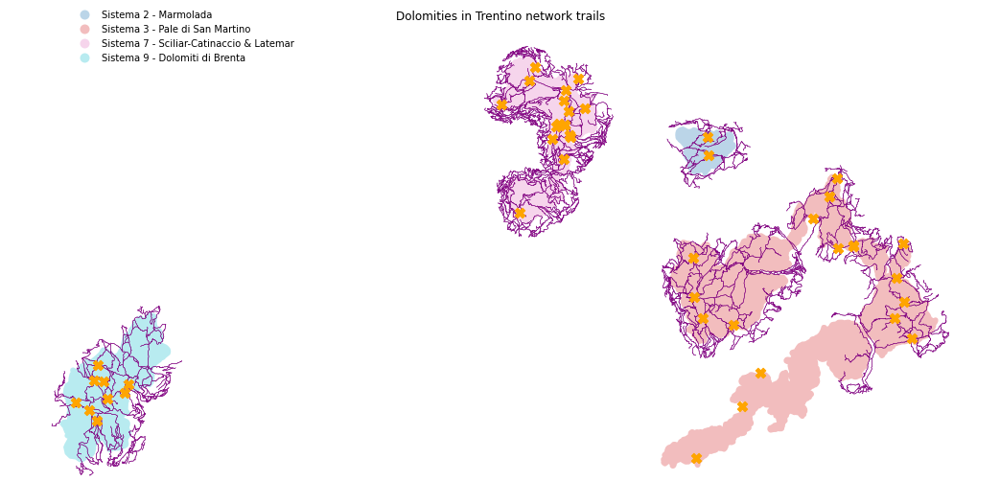

In [17]:
fig, axes = plt.subplots(1,1, figsize=(15,15))
plt.title("Dolomities in Trentino network trails")

dolomiti_df.to_crs(epsg=4326).plot(
    ax=axes,
    column='name', cmap = "tab10", alpha=0.3,
    legend=True, categorical=True,
    legend_kwds= {
        'bbox_to_anchor':(.3, 1.05),
        'fontsize':10,
        'frameon':False
        }
  )


ox.graph_to_gdfs(G_trail, edges=True, nodes=False).plot(ax=axes,  color='purple', linewidth=.5)
osm_rifugi.to_crs(epsg=4326).plot(ax=axes, color='orange', markersize=110, marker="X", zorder=3)

plt.tight_layout()
plt.axis('off')
plt.show()

In [18]:
# # too big
# sat_dolomities_map = utils.get_new_map(title='Access the SAT path from the street', tiles=tiles)
# feature_layers = {group:FeatureGroup(name=f"Group of dolomities: {group}") for group in unique_dolomities_group}
# feature_layers['trails'] =  FeatureGroup(name='trails')
# feature_layers['dolomiti_area'] =  FeatureGroup(name='Area Dolomiti')
# dolomiti_geo.add_to(feature_layers['dolomiti_area'])

# for idx, row in ox.graph_to_gdfs(G_trail, edges=True, nodes=False).iterrows():
#   line = PolyLine(
#     locations = [list(reversed(i)) for i in list(row.geometry.coords)],
#     tooltip = utils.get_info_from_row(row),
#     popup = utils.get_info_from_row(row),
#     color='darkred', weight=3,
#   )

#   line.add_to(feature_layers["trails"])


# for idx, row in osm_rifugi.iterrows():
#   marker_group = row.dolomities
#   marker = Marker(
#       location = [i[0] for i in reversed(row.geometry.centroid.xy)],
#       tooltip = utils.get_info_from_row(row),
#       popup = utils.get_info_from_row(row),
#       icon = Icon(color = styles.c_colors[unique_dolomities_group.index(row.dolomities)])
#   )
#   marker.add_to(feature_layers[marker_group])

# utils.add_map_infos(feature_layers, sat_dolomities_map, collapsed_legend=True)

## &nbsp; 2.2 Peaks - Huts on the Graph

for each of the highest peak we will check the closest hut and how far it is.

In [19]:
osm_dolomites_high_peak = gpd.read_file('data/peaks/high_peak.shp')

osm_rifugi.reset_index(inplace=True, drop=True)
osm_dolomites_high_peak.reset_index(inplace=True, drop=True)

In [20]:
# find the closest point in the network of trails and huts

osm_rifugi['closest_point_to_graph_id'] = osm_rifugi.geometry.apply(
    lambda x: ox.nearest_nodes(G_trail, x.coords[0][0], x.coords[0][1])
  )

osm_dolomites_high_peak['closest_point_to_graph_id'] = osm_dolomites_high_peak.geometry.apply(
    lambda x: ox.nearest_nodes(G_trail, x.coords[0][0], x.coords[0][1])
  )

In [21]:
def get_distance_real_point_to_closest_in_graph(row, G_trail):
  x_cord  = G_trail.nodes[row["closest_point_to_graph_id"]]['x']
  y_cord  = G_trail.nodes[row["closest_point_to_graph_id"]]['y']
  p = Point(x_cord, y_cord)
  p = gpd.GeoSeries(p, crs=4326).to_crs(epsg=32632).values[0]
  distance = row.geometry.distance(p)
  return distance

distance_huts = []
for _, row in osm_rifugi.to_crs(epsg=32632).iterrows():
  distance = get_distance_real_point_to_closest_in_graph(row, G_trail)
  distance_huts.append(distance)


distance_peaks = []
for _, row in osm_dolomites_high_peak.to_crs(epsg=32632).iterrows():
  distance = get_distance_real_point_to_closest_in_graph(row, G_trail)
  distance_peaks.append(distance)

osm_rifugi['distance_graph'] = distance_huts
osm_dolomites_high_peak['distance_graph'] = distance_peaks

In [22]:
# check how many elements are far from the point in the graph of 1km
print((osm_dolomites_high_peak['distance_graph'] > 1000).sum(), (osm_rifugi['distance_graph'] > 1000).sum())

# we filter only the elements that have a corrispective in the graph so discarding the elements far more than 1km
osm_dolomites_high_peak = osm_dolomites_high_peak.loc[osm_dolomites_high_peak['distance_graph'] < 1000]
osm_rifugi = osm_rifugi.loc[osm_rifugi['distance_graph'] < 1000]

30 3


we can actually control how far are the point on the graph to the peaks.

In [23]:
gs = []

for _, row in osm_dolomites_high_peak.iterrows():
  x_cord  = G_trail.nodes[row["closest_point_to_graph_id"]]['x']
  y_cord  = G_trail.nodes[row["closest_point_to_graph_id"]]['y']
  gs.append(
       Point(x_cord, y_cord)
    )

close_graph_peak_nodes = gpd.GeoDataFrame(geometry=gs, crs=4326)

In [24]:
sat_dolomities_map = utils.get_new_map(title='Peaks and Graph points', tiles=tiles)
feature_layers = {group:FeatureGroup(name=f"Group of dolomities: {group}") for group in ['graph', 'peak']}
feature_layers['dolomiti_area'] =  FeatureGroup(name='Area Dolomiti')
dolomiti_geo.add_to(feature_layers['dolomiti_area'])

for idx, row in close_graph_peak_nodes.iterrows():
  marker = Marker(
      location = [i[0] for i in reversed(row.geometry.xy)],
      icon = Icon(color = 'red'),
      tooltip = 'graph_closest_point',
  )

  marker.add_to(feature_layers['graph'])

for idx, row in osm_dolomites_high_peak.iterrows():
  marker = Marker(
      location = [i[0] for i in reversed(row.geometry.centroid.xy)],
      tooltip = utils.get_info_from_row(row),
      popup = utils.get_info_from_row(row),
      icon = Icon(color ='blue')
  )
  marker.add_to(feature_layers['peak'])

utils.add_map_infos(feature_layers, sat_dolomities_map, collapsed_legend=True)

## &nbsp; 2.3 Add *elevation* attributes 

Open-Elevation's API is extremely simple -- after all, it fits a single, specific, simple task. There is only one endpoint, which is documented here.

https://github.com/Jorl17/open-elevation/blob/master/docs/api.md

In [25]:
from tqdm import tqdm

def get_elevation(y_lat, x_lon):
  url = f"https://api.open-elevation.com/api/v1/lookup?locations={y_lat},{x_lon}"
  headers = {"Content-Type": "application/json", "Accept": "application/json"}
  raw_response  = requests.get(url=url, headers=headers)

  if raw_response.ok:
    response = raw_response.json()
    elevation = response['results'][0]['elevation']
    if elevation == 0:
      print(f'Elevation missed at point ({y_lat},{x_lon})')
    return elevation


if 'elevation' not in G_trail.nodes[list(G_trail.nodes)[0]]:
  for node in tqdm(G_trail.nodes, total=len(G_trail.nodes)):
    elevation = get_elevation(
        G_trail.nodes[node]['y'],
        G_trail.nodes[node]['x']
    )

    G_trail.nodes[node]['elevation'] = elevation
    
  # save with elevation infos
  ox.save_graphml(G_trail, 'data/trail_network.graphml')
 

G_trail = ox.elevation.add_edge_grades(
      G_trail, 
      add_absolute=True, 
      precision=10
  )

## &nbsp; 2.4 Add *edge_speeds* attributes 


We already have the inpedence with is a functin of the lenght and the grade_abs, in any case we would add manually the time speeds according to the grade_abs of the trail.

To do so we mark each edge with its corresponding quantile and then we will assign different velocity according to the level of the grade.

In [26]:
velocities = ['hiking','very_slow', 'slow', 'easy', 'super_easy', 'normal']
velocities_dict = {
      'hiking' : 0.60,
      'very_slow': 0.35,
      'slow': 0.20, 
      'easy': 0.10,
      'super_easy': 0.05,
      'normal': 0, 
    }


velocities_dict_km_h = {
      'hiking' : 1,
      'very_slow': 0.5,
      'slow': 1., 
      'easy': 1.5,
      'super_easy': 1.7,
      'normal': 2, 
    }


def change_highway_to_trail(data):
  grade = data['grade']
  downhill_discount = .65

  # set maximum of 1
  if np.abs(grade) > 1:
    if grade < 0: grade = -1
    else: grade = 1

  grade = (grade * downhill_discount) if grade < 0 else grade
  grade = np.abs(grade)

  for velocity in velocities:
    if grade >= velocities_dict[velocity]:
      return velocity


for _, _, _, data in G_trail.edges(keys=True, data=True):
  highway = change_highway_to_trail(data)
  data['highway'] = highway
  data['maxspeed'] = velocities_dict_km_h[highway] + 1

In [27]:
G_trail = ox.add_edge_speeds(G_trail, hwy_speeds = velocities_dict_km_h)
G_trail = ox.add_edge_travel_times(G_trail)

# detail information
edges = ox.graph_to_gdfs(G_trail, nodes=False)
edges.groupby("highway")[["length", "speed_kph", "travel_time"]].mean().round(1).sort_values('length', ascending=False)
edges.groupby("highway")[["length", "speed_kph"]].describe(percentiles=[0])

length                                                    \
             count        mean         std     min      0%       50%   
highway                                                                
easy        2595.0  579.622455  630.030374  15.248  15.248  362.1200   
hiking       428.0   69.070245   88.608637   4.748   4.748   47.3295   
normal      6791.0  225.737096  404.843315   0.032   0.032   75.4140   
slow        1496.0  454.161322  563.094321  15.248  15.248  244.9560   
super_easy  1846.0  606.993918  578.664055  10.642  10.642  418.5970   
very_slow    652.0  240.135009  334.337276  10.133  10.133  115.4885   

                     speed_kph                                
                 max     count mean  std  min   0%  50%  max  
highway                                                       
easy        5382.949    2595.0  2.5  0.0  2.5  2.5  2.5  2.5  
hiking      1100.156     428.0  2.0  0.0  2.0  2.0  2.0  2.0  
normal      5746.499    6791.0  3.0  0.0  3.0  3.0  3.0  3.0  
slow        5130.885    1496.0  2.0  0.0  2.0  2.0  2.0  2.0  
super_easy  5746.499    1846.0  2.7  0.0  2.7  2.7  2.7  2.7  
very_slow   2329.731     652.0  1.5  0.0  1.5  1.5  1.5  1.5

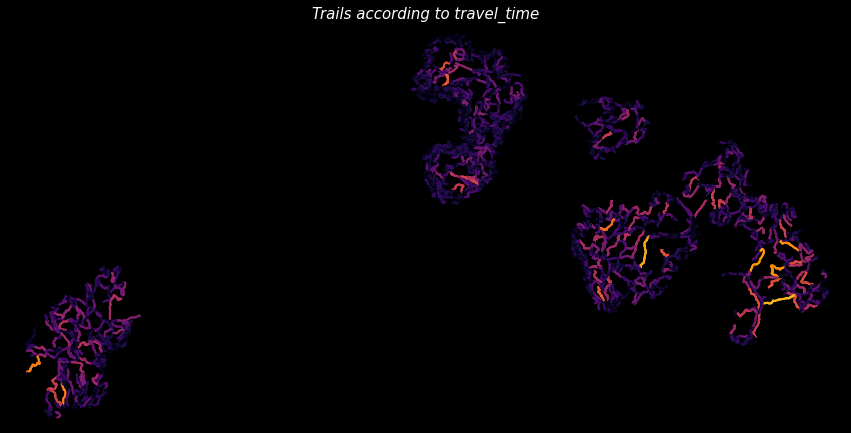

In [28]:
plt.style.use('dark_background')
fig, axes = plt.subplots(1,1, figsize=(15,15))
plt.title('Trails according to travel_time', fontdict=dict(size=15, style='italic', color='white'))

fig = ox.plot_graph(
    G_trail, 
    ax=axes,
    edge_color = ox.plot.get_edge_colors_by_attr(G_trail, 'travel_time', cmap='inferno'),
    edge_linewidth=2, 
    node_size=0,
    show=False
  )

# plt.savefig('image/time.jpg', dpi=300)
plt.show()

## &nbsp; 2.5 From huts to peaks considering elevation

we have to create a new variable to modify the weight of the walk; to do that we add a further attribute to each edge that depends on its grade_abs which is directly related to the elevation of the starting point and the end point of that edge.

In [29]:
# https://github.com/gboeing/osmnx-examples/blob/main/notebooks/12-node-elevations-edge-grades.ipynb
plt.style.use('default')

# define some edge impedance function here
def impedance(length, grade):
  uphill_penalty = 1.5
  downhill_penalty = 1.1

  # set maximum of 1
  if np.abs(grade) > 1:
    if grade < 0: grade = -1
    else: grade = 1

  if grade == 0:
    return length
  elif grade > 0:
    return uphill_penalty * (1 + grade) * length
  elif grade < 0:
    return uphill_penalty * (1 + grade) * length

# add impedance and elevation rise values to each edge in the projected graph
# use absolute value of grade in impedance function if you want to avoid uphill and downhill
for _, _, _, data in G_trail.edges(keys=True, data=True):
    data["impedance"] = impedance(data["length"], data["grade"])
    data["rise"] = data["length"] * data["grade"]

In [30]:
# https://napo.github.io/geospatial_course_unitn/solutions/05-streets_network_analysis
def route_nodes_to_line_networkx(nodelist, network):
  points = []
  for idnode in nodelist:
    lon = network.nodes[idnode]['x']
    lat = network.nodes[idnode]['y']
    point = Point(lon,lat)
    points.append(point)

  path = LineString(points)
  route = gpd.GeoDataFrame(
      dict(
          src_node = [nodelist[0]],
          tgt_node = [nodelist[-1]]
          ),
      geometry=[path],
      crs="epsg:4326"
  )
  return route


all_routes = []
for idx, row in osm_dolomites_high_peak.iterrows():
  hut = osm_rifugi.loc[osm_rifugi['name'] == row.closest_hu]
  raw_route = ox.shortest_path(
      G_trail, 
      hut.closest_point_to_graph_id.values[0], 
      row.closest_point_to_graph_id,
      weight='impedance'
    )
  
  if len(raw_route) > 1:
    route = route_nodes_to_line_networkx(raw_route, G_trail)
    edge_lengths = ox.utils_graph.get_route_edge_attributes(G_trail, raw_route, 'length')
    edge_times = ox.utils_graph.get_route_edge_attributes(G_trail, raw_route, 'travel_time')
    route['length'] = f"{round(sum(edge_lengths)/1000, 2)} km "
    route['times'] = f"{str(datetime.timedelta(seconds=sum(edge_times)))} h"
    route['hut'] = row.closest_hu
    route['peak'] = row['name']
    all_routes.append(route)


shortest_paths = pd.concat(all_routes).reset_index(drop=True)

In [31]:

osm_peak_hut_dolomities_map = utils.get_new_map(title='Shortest Path between peaks and huts', tiles=tiles)
groups = ['peak', 'hut', 'peak_hut_path']

feature_layers = {
    group:FeatureGroup(name=f"<span style='color:{styles.c_colors[idx]}'>{group.capitalize()}</span>") 
    for idx, group in enumerate(groups)
  }

feature_layers['dolomiti_area'] =  FeatureGroup(name='Area Dolomiti')
dolomiti_geo.add_to(feature_layers['dolomiti_area'])

# peaks
for idx, row in osm_dolomites_high_peak.iterrows():
  marker = Marker(
    location = [i[0] for i in reversed(row.geometry.xy)],
    popup = utils.get_info_from_row(row), 
    tooltip = utils.get_info_from_row(row),
    icon=folium.Icon(color='darkred')
  )
  marker.add_to(feature_layers['peak'])


# huts close to the peaks
set_uniques = osm_dolomites_high_peak['closest_hu'].unique()
for idx, row in osm_rifugi.loc[osm_rifugi.name.isin(set_uniques)].iterrows():
  marker = Marker(
    location = [i[0] for i in reversed(row.geometry.xy)],
    popup = utils.get_info_from_row(row), 
    tooltip = utils.get_info_from_row(row),
    icon=folium.Icon(color='blue')
  )
  marker.add_to(feature_layers['hut'])


# Linestring huts-peaks
for idx, row in shortest_paths.iterrows():
  line = folium.PolyLine(
    locations = [list(reversed(i)) for i in list(row.geometry.coords)],
    popup = utils.get_info_from_row(row), 
    tooltip = utils.get_info_from_row(row),
    color='purple',
    weight=10,
  )

  line.add_to(feature_layers['peak_hut_path'])

utils.add_map_infos(feature_layers, osm_peak_hut_dolomities_map, collapsed_legend=True)

# &nbsp; 3. Trentino-Alto Adige Street-Trail Network analyses

In [32]:
%%time 
# Querying all the network street of Trentino-Alto Adige
if 'graph.graphml' in os.listdir('data'):
  G_street = ox.load_graphml('data/graph.graphml')
else:
  G_street = ox.graph_from_place('Trentino-Alto Adige', network_type='drive')
  ox.save_graphml(G_street, 'data/graph.graphml')

G_street = ox.add_edge_speeds(G_street)
G_street = ox.add_edge_travel_times(G_street)

CPU times: user 26.3 s, sys: 1.14 s, total: 27.5 s
Wall time: 28.5 s


In [33]:
from shapely.geometry import box

gdf_street = ox.graph_to_gdfs(G_street, edges=True, nodes=False)
minx, miny, maxx, maxy = dolomiti_df.to_crs(epsg=32632).buffer(5_000).to_crs(epsg=4326).total_bounds
bbox = box(minx, miny, maxx, maxy)

clipped = gdf_street.geometry.apply(lambda x: x.within(bbox))
gdf_street_clipped = gdf_street.loc[clipped].reset_index()

## &nbsp; 3.1 Connect streets to trails

In [34]:
def extract_first_and_last_point_from_line(line_string):
  # Since the path are LineString we want to find the starting point
  # and the endpoint but we miss this information.
  first = list([i[0] for i in line_string.xy])
  last = list([i[-1] for i in line_string.xy])
  return (first, last)


def find_the_closest_node_to_drive_street(drive_network):
  def _find_distance(point, drive_network):
    raw_x, raw_y = point
    # find which is the closest to any street
    nearest_point = ox.nearest_nodes(drive_network, raw_x, raw_y)
    x_cord, y_cord =  (drive_network.nodes[nearest_point]['x'], drive_network.nodes[nearest_point]['y'])
    
    # from coordinates to point with projection
    shp_point = gpd.GeoSeries(
        Point(x_cord, y_cord), crs=4326
      ).to_crs(epsg=32632).values[0]

    # find distance
    distance = shp_point.distance(
      gpd.GeoSeries(
          Point(raw_x, raw_y), crs=4326
        ).to_crs(epsg=32632).values[0]
      )
    
    return (distance, nearest_point, (raw_x, raw_y))
    
  id_nodes_in_graph = []
  nearest_point_into_street = []

  for idx, (first, last) in tqdm(enumerate(nodes_from_line), total=len(nodes_from_line)):
    distace_1, nearest_point_1, raw_xy_1  = _find_distance((first[0], first[1]), drive_network)
    f_point, raw_cords = (nearest_point_1, raw_xy_1)
    id_nodes_in_graph.append(f_point)
    nearest_point_into_street.append(raw_cords)

  return (id_nodes_in_graph, nearest_point_into_street)


if 'graph_node_gdf.shp' in os.listdir('data/alpine_huts'):
  graph_node_gdf = gpd.read_file('data/alpine_huts/graph_node_gdf.shp')
  graph_node_gdf.reset_index(inplace=True)

else:
  graph_node_gdf = ox.graph_to_gdfs(G_trail, edges=False, nodes=True)
  nodes_from_line = [extract_first_and_last_point_from_line(line) for line in graph_node_gdf.geometry]
  id_nodes_in_graph, nearest_point_into_street = find_the_closest_node_to_drive_street(G_street)
  
  raw_x, raw_y = [], []
  for x,y in nearest_point_into_street:
    raw_x.append(x); raw_y.append(y)

  graph_node_gdf['closest_point_to_graph_id'] = id_nodes_in_graph
  graph_node_gdf['raw_x_nearest_point_to_graph'] = raw_x
  graph_node_gdf['raw_y_nearest_point_to_graph'] = raw_y
  graph_node_gdf.reset_index(inplace=True)
  graph_node_gdf.to_file('data/alpine_huts/graph_node_gdf.shp')


In [35]:
# find the trail from the huts to the street
sentieri_huts_streets = []
point_trail_street = []

for idx, row in osm_rifugi.iterrows():
  rifugio_closest_point_to_graph = row.closest_point_to_graph_id
  graph_node_hut = graph_node_gdf.loc[graph_node_gdf.osmid == rifugio_closest_point_to_graph]
  
  trail_closest_point_to_street_graph = graph_node_hut.closest_po.values[0]
  raw_x, raw_y = G_street.nodes[trail_closest_point_to_street_graph]['x'], G_street.nodes[trail_closest_point_to_street_graph]['y']
  street_point = Point(raw_x, raw_y)
  
  street_details = dict(
      street_graph_id=trail_closest_point_to_street_graph,
      geometry=street_point, 
      hut=row['name'], 
    )
  
  point_trail_street.append(street_details)
  street_closest_point_to_trail_graph = ox.nearest_nodes(G_trail, raw_x, raw_y)
  graph_node_street = graph_node_gdf.loc[graph_node_gdf.osmid == street_closest_point_to_trail_graph]

  route_hut_street = ox.shortest_path(
      G_trail, 
      [rifugio_closest_point_to_graph], 
      [street_closest_point_to_trail_graph],
      weight='impedance'
    )

  try:
    route = route_nodes_to_line_networkx(route_hut_street[0], G_trail)
    route['raw_route'] = ",".join([str(i) for i in route_hut_street[0]])
    route['end_elevation'] = graph_node_hut.elevation.values[0]
    route['starting_elevation'] = graph_node_street.elevation.values[0]
    route['difference'] = route['end_elevation'] - route['starting_elevation']
    route["dolomities"] = row['dolomities']
    route['hut'] = row['name']
    sentieri_huts_streets.append(route)
  except Exception as e:
    pass


sentieri_huts_streets = pd.concat(sentieri_huts_streets).reset_index(drop=True)
point_trail_street = gpd.GeoDataFrame(point_trail_street, crs="EPSG:4326").reset_index(drop=True)

In [36]:
sat_dolomities_map = utils.get_new_map(title='Access the SAT path from the street', tiles=tiles)
feature_layers = {group:FeatureGroup(name=f"Group of dolomities: {group}") for group in unique_dolomities_group}
feature_layers['dolomiti_area'] =  FeatureGroup(name='Area Dolomiti')
feature_layers['closest_points'] =  FeatureGroup(name='Closest points')
dolomiti_geo.add_to(feature_layers['dolomiti_area'])

# SAT Paths
for idx, row in sentieri_huts_streets.iterrows():
  row = row.drop(columns=['raw_route'])
  line_group = row.dolomities
  line = PolyLine(
    locations = [list(reversed(i)) for i in list(row.geometry.coords)],
    tooltip = utils.get_info_from_row(row),
    popup = utils.get_info_from_row(row),
    color='darkred', weight=3,
  )

  line.add_to(feature_layers[line_group])

  point = point_trail_street.iloc[idx]
  closest_point = folium.CircleMarker(
      location= [list(reversed(i)) for i in list(point.geometry.coords)][0],
      radius = 5, color="#3186cc",
      weight=4, fill=True, fill_color="#3186cc"
  )

  closest_point.add_to(feature_layers['closest_points'])

for idx, row in osm_rifugi.iterrows():
  row = row.drop(columns=['raw_route'])
  marker_group = row.dolomities
  marker = Marker(
      location = [i[0] for i in reversed(row.geometry.centroid.xy)],
      tooltip = utils.get_info_from_row(row),
      popup = utils.get_info_from_row(row),
      icon = Icon(color = styles.c_colors[unique_dolomities_group.index(row.dolomities)])
  )
  marker.add_to(feature_layers[marker_group])

utils.add_map_infos(feature_layers, sat_dolomities_map, collapsed_legend=True)

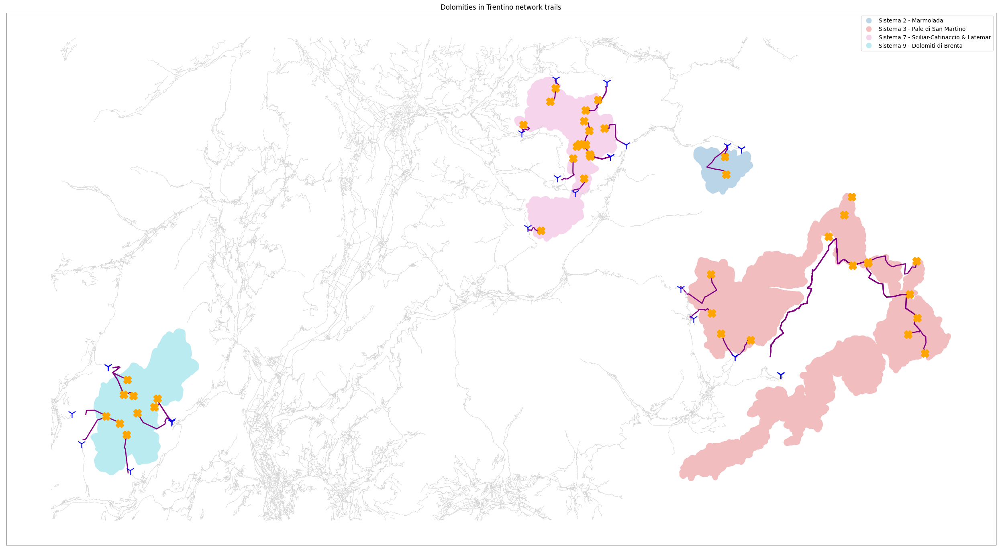

In [37]:
fig, axes = plt.subplots(1,1, figsize=(25,25))
plt.title("Dolomities in Trentino network trails")

dolomiti_df.to_crs(epsg=4326).plot(
    zorder=0,
    ax=axes,
    column='name', cmap = "tab10", alpha=0.3,
    legend=True, categorical=True,
  )


sentieri_huts_streets.to_crs(epsg=4326).plot(ax=axes,  color='purple', linewidth=2, zorder=2)
gdf_street_clipped.to_crs(epsg=4326).plot(ax=axes, color='lightgray', linewidth=.4, zorder=2)

osm_rifugi.to_crs(epsg=4326).plot(ax=axes, color='orange', markersize=150, marker="X", linewidth=3, zorder=3)
point_trail_street.to_crs(epsg=4326).plot(ax=axes, color='blue', markersize=250, marker="1", zorder=3)

plt.xticks([]); plt.yticks([])
plt.tight_layout()
plt.show()

## &nbsp; 3.2 Tn/Bz to huts

In [38]:
class PathFinder:
  def __init__(self, hut_df, trail_df, trail_street_df, G_trail, G_street):
    self.hut_df = hut_df
    self.trail_df = trail_df
    self.trail_street_df = trail_street_df
    self.G_trail = G_trail
    self.G_street = G_street
    self.cities_centroid = self.load_centroid_in_graph_common_city()


  def generate_route_trail_hut(self, hut_name, starting_city='Trento', return_path=False):
    hut_row = self.hut_df.loc[self.hut_df['name'] == hut_name]
    hut_in_graph = hut_row.closest_point_to_graph_id.values[0]
    distance_hut_graph = hut_row.distance_graph.values[0]
    self.print_info(hut_row, False)

    trail_hut_street =  self.trail_df.loc[ self.trail_df.src_node == hut_in_graph]
    route_trail = list(reversed([int(i) for i in trail_hut_street.raw_route.values[0].split(",")]))
    self.__print_route_stats(route_trail)

    trail = trail_hut_street.geometry.values[0]

    point_street = self.trail_street_df.loc[self.trail_street_df.hut == hut_name].geometry.values[0]
    street_point_id = self.trail_street_df.loc[self.trail_street_df.hut == hut_name].street_graph_id.values[0]

    street_route = ox.shortest_path(
      self.G_street, 
      street_point_id, 
      self.cities_centroid[starting_city], 
      weight='travel_time'
    )

    edge_lengths = ox.utils_graph.get_route_edge_attributes(self.G_street, street_route, 'length')
    edge_times = ox.utils_graph.get_route_edge_attributes(self.G_street, street_route, 'travel_time')
    print('Street info:'); print(f"The route is long {round(sum(edge_lengths)/1000)}km")
    print(f"The route takes {str(datetime.timedelta(seconds=sum(edge_times)))}"); print(f"{'-'*100}\n")

    map = self.generate_map(street_route, hut_row, trail_hut_street, point_street, '')
    return (map, self.route_nodes_to_line_networkx(street_route)) if return_path else map


  def generate_map(self, route, hut, trail, street, detail):
    dolomities_group = hut.dolomities.values[0]

    feature_layers = dict(
      dolomiti_area =  FeatureGroup(name = 'Area Dolomiti'),
      alpine_trail =  FeatureGroup(name = 'Alpine trail'),
      street_trail =  FeatureGroup(name = 'Street-Trail joint'),
      dolomities_group = FeatureGroup(name = f"Group of dolomities: {dolomities_group}")
        
    )

    # street
    route_map = ox.plot_route_folium(self.G_street, route, tiles='OpenStreetMap')

    # joint point
    closest_point = folium.CircleMarker(
        location= [list(reversed(i)) for i in list(street.coords)][0],
        radius=8, color="green",
        weight=4, fill=True, fill_color="green",
    ).add_to(feature_layers['street_trail'])

    # dolomiti geo
    dolomiti_geo_ = GeoJson(
        data=dolomiti_df.loc[dolomiti_df['name']==hut.dolomities.values[0]], 
        style_function = styles.style_dolomiti, 
        tooltip=GeoJsonTooltip(fields=['name', 'url_info', 'area'])
      ).add_to(feature_layers['dolomiti_area'])


    # trail
    trail = PolyLine(
      locations = [list(reversed(i)) for i in list(trail.geometry.values[0].coords)],
      tooltip = self.custom_info(trail),
      popup = self.custom_info(trail),
      color='darkred', weight=3,
    ).add_to(feature_layers['alpine_trail'])

    
    # huts
    color = styles.c_colors[unique_dolomities_group.index(dolomities_group)]
    marker = Marker(
        location = [list(reversed(i)) for i in list(hut.geometry.values[0].coords)][0],
        tooltip = self.custom_info(hut),
        popup = self.custom_info(hut),
        icon = Icon(color = color)
    ).add_to(feature_layers["dolomities_group"])

    return utils.add_map_infos(feature_layers, route_map, collapsed_legend=True, reverse_order=False)


  def load_centroid_in_graph_common_city(self) -> dict:
    "return the nodes in the graph"
    
    Trento = (11.121597, 46.065489)
    Bolzano = (11.346474, 46.492602)
    return dict(
        Bolzano = ox.nearest_nodes(self.G_street, Bolzano[0], Bolzano[1]),
        Trento = ox.nearest_nodes(self.G_street, Trento[0], Trento[1])
    )


  def print_info(self, hut_row, title=True):
    if not title:
      print(f"{'-' * 100}")
    print('Hut info:'); 
    print(self.custom_info(hut_row, '\n'))
    print(f"{'-' * 100}")
    

  def __print_route_stats(self, route):
    print('Trail info:')
    route_grades = ox.utils_graph.get_route_edge_attributes(self.G_trail, route, "grade_abs")
    edge_times = ox.utils_graph.get_route_edge_attributes(self.G_trail, route, 'travel_time')
    route_rises = ox.utils_graph.get_route_edge_attributes(self.G_trail, route, "rise")
    route_lengths = ox.utils_graph.get_route_edge_attributes(self.G_trail, route, "length")
    ascent = np.sum([rise for rise in route_rises if rise >= 0])
    descent = np.sum([rise for rise in route_rises if rise < 0])

    print(f"Estimated time: {str(datetime.timedelta(seconds=sum(edge_times)))} hours")
    print(f"The average grade is {round(np.mean(route_grades) * 100)}% and the max is {round(np.max(route_grades) * 100)}%")
    print(f"Total elevation change is {round(np.sum(route_rises))} meters: {round(ascent)} meter ascent and {round(abs(descent))} meter descent")
    print(f"Total trip distance: {round(np.sum(route_lengths))} meters")
    print(f"{'-' * 100}")


  def custom_info(self, slice_df, join_type='<br/>'):
    i = slice_df.to_dict(orient='list')
    i = [f"{k.capitalize()}: {v[0]}"  for k,v in i.items() if v[0] and k != 'geometry' and k != 'raw_route']
    return join_type.join(i)


  def get_trento_bz_raw_coordinates(self):
    trento = (
        self.G_street.nodes[self.cities_centroid['Trento']]['x'],
        self.G_street.nodes[self.cities_centroid['Trento']]['y'],
      )
    
    bz = (
        self.G_street.nodes[self.cities_centroid['Bolzano']]['x'],
        self.G_street.nodes[self.cities_centroid['Bolzano']]['y'],
      )
    
    return dict(
        Trento = Point(trento),
        Bolzano = Point(bz),
    )


  def route_nodes_to_line_networkx(self, route):
    points = []
    for idnode in route:
      lon = self.G_street.nodes[idnode]['x']
      lat = self.G_street.nodes[idnode]['y']
      point = Point(lon,lat)
      points.append(point)
    
    nodes = dict(
              src_node = [route[0]],
              tgt_node = [route[-1]]
            )

    return gpd.GeoDataFrame(nodes, geometry=[LineString(points)], crs="epsg:4326")


osm_rifugi['name'] = osm_rifugi['name'].apply(lambda x: x.replace('è','e').replace('ü', 'u').replace('ö', 'o'))
sentieri_huts_streets['hut'] = sentieri_huts_streets['hut'].apply(lambda x: x.replace('è','e').replace('ü', 'u').replace('ö', 'o'))
point_trail_street['hut'] = point_trail_street['hut'].apply(lambda x: x.replace('è','e').replace('ü', 'u').replace('ö', 'o'))
app = PathFinder(osm_rifugi, sentieri_huts_streets, point_trail_street, G_trail, G_street)

In [39]:
%%capture
tn_paths, bz_paths = [], []
for i in  osm_rifugi['name'].unique():
  try:
    bz_paths.append(app.generate_route_trail_hut(i, starting_city='Bolzano', return_path=True)[1])
    tn_paths.append(app.generate_route_trail_hut(i, starting_city='Trento', return_path=True)[1])
  except Exception as e:
    print(e)

tn_street_trails_gdf = pd.concat(tn_paths)
bz_street_trails_gdf = pd.concat(bz_paths)
bz_tn = gpd.GeoDataFrame(
    pd.DataFrame(app.get_trento_bz_raw_coordinates(), index=['geometry']).T.reset_index(),  
    crs=4236
  )

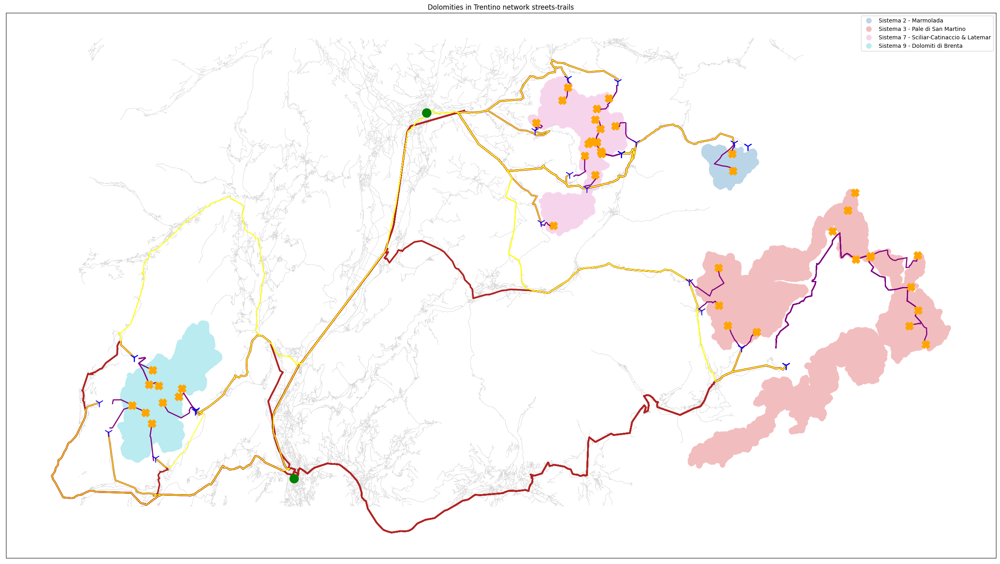

In [40]:
fig, axes = plt.subplots(1,1, figsize=(25,25))
plt.title("Dolomities in Trentino network streets-trails")

dolomiti_df.to_crs(epsg=4326).plot(
    zorder=0,
    ax=axes,
    column='name', cmap = "tab10", alpha=0.3,
    legend=True, categorical=True,
  )


gdf_street_clipped.to_crs(epsg=4326).plot(ax=axes, color='lightgray', linewidth=.4, zorder=2)
sentieri_huts_streets.to_crs(epsg=4326).plot(ax=axes,  color='purple', linewidth=2, zorder=2)

bz_tn.plot(ax=axes, color='green', markersize=250, marker="o", zorder=3)

tn_street_trails_gdf.geometry = tn_street_trails_gdf.to_crs(epsg=32632).buffer(100)
bz_street_trails_gdf.geometry = bz_street_trails_gdf.to_crs(epsg=32632).buffer(50)
tn_street_trails_gdf.to_crs(epsg=4326).plot(ax=axes, color='firebrick', linewidth=1, zorder=2)
bz_street_trails_gdf.to_crs(epsg=4326).plot(ax=axes, color='yellow', linewidth=1, zorder=2)

osm_rifugi.to_crs(epsg=4326).plot(ax=axes, color='orange', markersize=150, marker="X", linewidth=3, zorder=3)
point_trail_street.to_crs(epsg=4326).plot(ax=axes, color='blue', markersize=250, marker="1", zorder=3)

plt.xticks([]); plt.yticks([])
plt.tight_layout()
plt.show()

In [41]:
#@title 3.3 Navigate! { form-width: "1000px", display-mode: "form" }
#@markdown Select the city between Trento and Bolzano.
starting_city = "Trento" #@param ["Trento", "Bolzano"]

#@markdown Select the desired alpine hut
selected_huts = "Rifugio Francis Fox Tuckett" #@param [ "Mahlknecht Hutte - Rifugio Molignon", "Schlernhaus - Rifugio Bolzano", "Tierser Alpl Hutte - Rifugio Alpe di Tires", "Grasleitenhutte - Rifugio Bergamo", "Santnerpasshutte - Rifugio Passo Santner", "Rosengartenhutte - Rifugio Fronza alle Coronelle", "Schutzhaus Tschafon - Rifugio Monte Cavone", "Schlernbodele Hutte - Rifugio Malghetta Sciliar", "Gartlhutte - Rifugio Re Alberto", "Rifugio Cacciatore", "Rifugio Val d'Ambiez - Silvio Agostini", "Rifugio Maria e Alberto al Brentei", "Rifugio Francis Fox Tuckett", "Rifugio Alimonta", "Rifugio XII Apostoli", "Rifugio Antermoia", "Rifugio Preuss", "Rifugio Vajolet", "Rifugio Capanna al Ghiacciaio", "Rifugio Gardeccia", "Rifugio Stella Alpina", "Rifugio Pradidali", "Rifugio Passo Principe - Grasleitenpasshutte", "Rifugio Tommaso Pedrotti", "Rifugio Torre di Pisa", "Rifugio Treviso", "Rifugio Rosetta \"Giovanni Pedrotti\"", "Ex Rifugio Catinaccio", "Rifugio Roda di Vael", "Rifugio Croz dell'Altissimo", "Rifugio Selvata", "Rifugio Pian de Fontana", "Rifugio 7° Alpini", "Rifugio Giovanni Angelini", "Rifugio Mario Vazzoler", "Rifugio Maria Vittoria Torrani", "Rifugio Bruto Carestiato", "Rifugio San Sebastiano", "Rifugio Passo Duran \"C.Tome\"", "Rifugio Sommariva al Pramperet", "Rifugio Furio Bianchet", "Rifugio Giuseppe Volpi di Misurata al Mulaz", "Rifugio Onorio Falier", "Rifugio Adolfo Sonino al Coldai", "Rifugio Maria Vittoria Torrani" ]

app.generate_route_trail_hut(selected_huts, starting_city)

----------------------------------------------------------------------------------------------------
Hut info:
Name: Rifugio Francis Fox Tuckett
Ele: 2272.0
Operator: Società degli Alpinisti Tridentini
Opening_ho: Jun 20-Sep 20
Capacity: 110
Contact_mo: +39 335 5253090
Website: http://www.rifugio-tuckett.it/
Den_prov: Trento
Dolomities: Sistema 9 - Dolomiti di Brenta
Closest_point_to_graph_id: 4360180765
Distance_graph: 11.990632944986912
----------------------------------------------------------------------------------------------------
Trail info:
Estimated time: 2:05:37.900000 hours
The average grade is 125% and the max is 947%
Total elevation change is 701 meters: 701 meter ascent and 0 meter descent
Total trip distance: 5260 meters
----------------------------------------------------------------------------------------------------
Street info:
The route is long 73km
The route takes 1:16:24.500000
-------------------------------------------------------------------------------------